In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Load Model

In [ ]:
import sys, os
%cd /content/drive/MyDrive/stylegan2-colab/stylegan2/
%tensorflow_version 1.x
import tensorflow as tf

import pretrained_networks
import dnnlib
from dnnlib import tflib

import run_projector
import projector
import dnnlib
import dnnlib.tflib as tflib

from pathlib import Path
import PIL
import pickle
import numpy as np

import ipywidgets as widgets
from matplotlib import pyplot as plt
from tqdm import tqdm

/content/drive/MyDrive/stylegan2-colab/stylegan2
TensorFlow 1.x selected.


In [ ]:
# Code to load the StyleGAN2 Model
def load_model():
    _G, _D, Gs = pretrained_networks.load_networks(model_path)
    
    noise_vars = [var for name, var in Gs.components.synthesis.vars.items() if name.startswith('noise')]
    
    Gs_kwargs = dnnlib.EasyDict()
    Gs_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    Gs_kwargs.randomize_noise = False
    Gs_kwargs.truncation_psi = 0.7
    
    return Gs, noise_vars, Gs_kwargs

def load_projector(Gs):
  proj = projector.Projector()
  proj.set_network(Gs)  

  return proj

In [ ]:
ROOT = '/content/drive/MyDrive/Junior Year/IW/Code'
# model_path = '/content/drive/MyDrive/stylegan2-colab/stylegan2/results/00059-stylegan2-medium_logos_3-1gpu-config-e/network-snapshot-006023.pkl'
model_path = '/content/drive/MyDrive/stylegan2-colab/stylegan2/results/00024-stylegan2-medium_logos-1gpu-config-f/network-snapshot-000866.pkl'

# Loading the StyleGAN2 Model!
Gs, noise_vars, Gs_kwargs = load_model()
proj = load_projector(Gs)

Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.


In [ ]:
# Generate images from a list of latents
def generate_from_seeds(seed_list):
    array_list = []
    image_list = []
    for seed in seed_list:
        # Generate image.
        rnd = np.random.RandomState(seed)
        z = rnd.randn(1, *Gs.input_shape[1:])
        tflib.set_vars({var: rnd.randn(*var.shape.as_list()) for var in noise_vars})

        images = Gs.run(z, None, **Gs_kwargs)
        array_list.append(images[0])
        image_list.append(PIL.Image.fromarray(images[0], 'RGB'))
        
    return array_list, image_list
  
def style_mixing_example(network_pkl, row_seeds, col_seeds, truncation_psi, col_styles, minibatch_size=4):
    print('Loading networks from "%s"...' % network_pkl)
    _G, _D, Gs = pretrained_networks.load_networks(network_pkl)
    w_avg = Gs.get_var('dlatent_avg') # [component]

    Gs_syn_kwargs = dnnlib.EasyDict()
    Gs_syn_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    Gs_syn_kwargs.randomize_noise = False
    Gs_syn_kwargs.minibatch_size = minibatch_size

    print('Generating W vectors...')
    all_seeds = list(set(row_seeds + col_seeds))
    all_z = np.stack([np.random.RandomState(seed).randn(*Gs.input_shape[1:]) for seed in all_seeds]) # [minibatch, component]
    all_w = Gs.components.mapping.run(all_z, None) # [minibatch, layer, component]
    all_w = w_avg + (all_w - w_avg) * truncation_psi # [minibatch, layer, component]
    w_dict = {seed: w for seed, w in zip(all_seeds, list(all_w))} # [layer, component]

    print('Generating images...')
    all_images = Gs.components.synthesis.run(all_w, **Gs_syn_kwargs) # [minibatch, height, width, channel]
    image_dict = {(seed, seed): image for seed, image in zip(all_seeds, list(all_images))}

    print('Generating style-mixed images...')
    for row_seed in row_seeds:
        for col_seed in col_seeds:
            w = w_dict[row_seed].copy()
            w[col_styles] = w_dict[col_seed][col_styles]
            image = Gs.components.synthesis.run(w[np.newaxis], **Gs_syn_kwargs)[0]
            image_dict[(row_seed, col_seed)] = image

    print('Saving image grid...')
    _N, _C, H, W = Gs.output_shape
    canvas = PIL.Image.new('RGB', (W * (len(col_seeds) + 1), H * (len(row_seeds) + 1)), 'white')
    for row_idx, row_seed in enumerate([None] + row_seeds):
        for col_idx, col_seed in enumerate([None] + col_seeds):
            if row_seed is None and col_seed is None:
                continue
            key = (row_seed, col_seed)
            if row_seed is None:
                key = (col_seed, col_seed)
            if col_seed is None:
                key = (row_seed, row_seed)
            canvas.paste(PIL.Image.fromarray(image_dict[key], 'RGB'), (W * col_idx, H * row_idx))
    
    # canvas.save(dnnlib.make_run_dir_path(ROOT + '/grid.png'))
    return canvas

1: 1769094
2: 8181965
3: 5491687
4: 6534785
5: 5139169
6: 4659211
7: 9142970
8: 8684579
9: 7740186


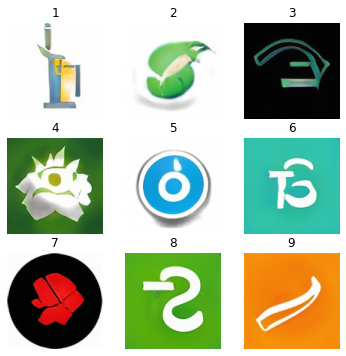

In [ ]:
import random
import matplotlib.pyplot as plt
from PIL import Image

w=10
h=10
fig=plt.figure(figsize=(6, 6))
columns = 3
rows = 3

good_seeds = [391049438, 812988239, 864684474, 169869150, 1821476060, 1736720173, 1388122245, 470455603, 109205828, 
              1466675128, 810863819, 172582121, 227593680, 297356458, 350606507,
              1428287491, 843, 145, 5310, 3967, 389746, 2124813335, 1444062920, 1651583255,
              715622503, 130814676, 57, 20, 670, 3345, 33457, 137, 138, 812988233, 32353, 8469015,
              1723225816, 196525129, 57873533, 1513149282, 1967834917, 418002533, 1442228425, 1193347417,
              130029044, 198562280, 1093333447, 1611767532, 1556421108, 684367779, 1922093669, 
              1370174848, 1540350065, 1706219851, 537009070, 908536436, 1716616451, 295283057, 842246229,
              1356768744, 195488666, 1294954460, 2502608, 349442220, 740312126, 1252333816, 1021847599, 
              1113669133, 1917592453, 1052444511, 446373871, 125393091, 1198508016, 1399116885, 1224077971, 
              1726114719, 994796117, 1306037308, 1860705326, 1259247846, 872237283, 889028859, 68870, 
              6163011, 9761915, 2316994, 4406784, 1478901, 1099883, 5762883, 669401, 8233848, 
              1411392, 9721645, 7909081, 6627487, 4256231, 7437617, 2505165,4810889, 5118905,4130511,
              8363717, 5605210, 9974734,6708912, 6778971,  1505868, 1985516, 8490175, 3917031,8418053,
              3551408, 9454108, 4914523
              ]

# Ask generator to make 10 random outputs
for j in range(1, columns*rows +1):
  yah = j
  i = good_seeds[yah]
  i = random.randint(0, 10000000)
  print(f'{j}: {i}')
  images, _ = generate_from_seeds([i])
  images = np.asarray(images)
  image = Image.fromarray(images[0]).resize((128, 128))
  fig.add_subplot(rows, columns, j)
  plt.axis('off')
  plt.title(yah)
  plt.imshow(image)

plt.show()

In [ ]:
good_seeds = [391049438, 812988239, 864684474, 169869150, 1821476060, 1736720173, 1388122245, 470455603, 109205828, 1466675128, 810863819, 172582121, 227593680, 297356458, 350606507,
              1428287491]

In [ ]:
[391049438, 864684474, 2], col_seeds=[1821476060,810863819,1428287491, 109205828, 350606507]

SyntaxError: ignored

In [ ]:
good_seeds = [391049438, 812988239, 864684474, 169869150, 1821476060, 1736720173, 1388122245, 470455603, 109205828, 
              1466675128, 810863819, 172582121, 227593680, 297356458, 350606507,
              1428287491, 843, 145, 5310, 3967, 389746]

In [ ]:
_, images = generate_from_seeds([391049438])
images[0]

# images[0].save(ROOT + '/latent_exploration/' + '5.png')

NameError: ignored

In [ ]:
def get_final_latents(load_folder):
    last_result = Path(load_folder)

    latent_files = [x for x in last_result.iterdir() if 'final_latent_code' in x.name]
    latent_files.sort()
    
    all_final_latents = []
    
    for file in latent_files:
        with open(file, mode='rb') as latent_pickle:
            all_final_latents.append(pickle.load(latent_pickle))
    
    return all_final_latents

In [ ]:
latent_codes = get_final_latents('results/00031-project-real-images')

In [ ]:
def generate_image_from_projected_latents(latent_vector):
    images = Gs.components.synthesis.run(latent_vector, **Gs_kwargs)
    return images

def get_concat_h(im1, im2):
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

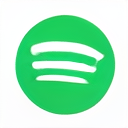

In [ ]:
# Ask the generator to make an output, given a latent code we found from the projection process.
index1 = 3

images = generate_image_from_projected_latents(latent_codes[index1])
recreated_img1 = Image.fromarray(images[0]).resize((128, 128))

recreated_img1

In [ ]:
def style_mixing_example(network_pkl, row_seeds, col_seeds, truncation_psi, col_styles, minibatch_size=4):
    print('Loading networks from "%s"...' % network_pkl)
    _G, _D, Gs = pretrained_networks.load_networks(network_pkl)
    w_avg = Gs.get_var('dlatent_avg') # [component]

    Gs_syn_kwargs = dnnlib.EasyDict()
    Gs_syn_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    Gs_syn_kwargs.randomize_noise = False
    Gs_syn_kwargs.minibatch_size = minibatch_size

    print('Generating W vectors...')
    all_seeds = list(set(row_seeds + col_seeds))
    all_z = np.stack([np.random.RandomState(seed).randn(*Gs.input_shape[1:]) for seed in all_seeds]) # [minibatch, component]
    all_w = Gs.components.mapping.run(all_z, None) # [minibatch, layer, component]
    all_w = w_avg + (all_w - w_avg) * truncation_psi # [minibatch, layer, component]
    w_dict = {seed: w for seed, w in zip(all_seeds, list(all_w))} # [layer, component]

    print('Generating images...')
    all_images = Gs.components.synthesis.run(all_w, **Gs_syn_kwargs) # [minibatch, height, width, channel]
    image_dict = {(seed, seed): image for seed, image in zip(all_seeds, list(all_images))}

    print('Generating style-mixed images...')
    for row_seed in row_seeds:
        for col_seed in col_seeds:
            w = w_dict[row_seed].copy()
            w[col_styles] = w_dict[col_seed][col_styles]
            image = Gs.components.synthesis.run(w[np.newaxis], **Gs_syn_kwargs)[0]
            image_dict[(row_seed, col_seed)] = image

    print('Saving image grid...')
    _N, _C, H, W = Gs.output_shape
    canvas = PIL.Image.new('RGB', (W * (len(col_seeds) + 1), H * (len(row_seeds) + 1)), 'white')
    for row_idx, row_seed in enumerate([None] + row_seeds):
        for col_idx, col_seed in enumerate([None] + col_seeds):
            if row_seed is None and col_seed is None:
                continue
            key = (row_seed, col_seed)
            if row_seed is None:
                key = (col_seed, col_seed)
            if col_seed is None:
                key = (row_seed, row_seed)
            canvas.paste(PIL.Image.fromarray(image_dict[key], 'RGB'), (W * col_idx, H * row_idx))
    
    # canvas.save(dnnlib.make_run_dir_path(ROOT + '/grid.png'))
    return canvas

In [ ]:
## Generating style mixes for projections
latent_codes = get_final_latents('results/00031-project-real-images')

row_w = [latent_codes[0], latent_codes[1], latent_codes[2], latent_codes[3]]
col_w = [latent_codes[0], latent_codes[1], latent_codes[2], latent_codes[3]]
col_styles = [i for i in range(0, 5)]

Gs_syn_kwargs = dnnlib.EasyDict()
Gs_syn_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
Gs_syn_kwargs.randomize_noise = False
Gs_syn_kwargs.minibatch_size = 4

row_seeds = [i for i in range(len(row_w))]
col_seeds = [i for i in range(len(row_w)+1, len(col_w)+len(row_w) + 1)]

all_seeds = list(set(row_seeds + col_seeds))

w_avg = Gs.get_var('dlatent_avg') # [component]
truncation_psi = 1


print('Generating W vectors...')
all_w = np.concatenate((row_w, col_w), axis=0).squeeze()
all_w = w_avg + (all_w - w_avg) * truncation_psi
all_images = Gs.components.synthesis.run(all_w, **Gs_kwargs)
image_dict = {(seed, seed): image for seed, image in zip(all_seeds, list(all_images))}
w_dict = {seed: w for seed, w in zip(all_seeds, list(all_w))} # [layer, component]

print('Generating style-mixed images...')
for row_seed in row_seeds:
    for col_seed in col_seeds:
        w = w_dict[row_seed].copy()
        w[col_styles] = w_dict[col_seed][col_styles]
        image = Gs.components.synthesis.run(w[np.newaxis], **Gs_syn_kwargs)[0]
        image_dict[(row_seed, col_seed)] = image

print('Saving image grid...')
_N, _C, H, W = Gs.output_shape
canvas = PIL.Image.new('RGB', (W * (len(col_seeds) + 1), H * (len(row_seeds) + 1)), 'white')
for row_idx, row_seed in enumerate([None] + row_seeds):
    for col_idx, col_seed in enumerate([None] + col_seeds):
        if row_seed is None and col_seed is None:
            continue
        key = (row_seed, col_seed)
        if row_seed is None:
            key = (col_seed, col_seed)
        if col_seed is None:
            key = (row_seed, row_seed)
        canvas.paste(PIL.Image.fromarray(image_dict[key], 'RGB'), (W * col_idx, H * row_idx))

# canvas.save(dnnlib.make_run_dir_path(ROOT + '/grid.png'))
canvas

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py", line 2882, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-10-96e2e196a130>", line 2, in <module>
    latent_codes = get_final_latents('results/00031-project-real-images')
NameError: name 'get_final_latents' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py", line 1823, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/ultratb.py", line 1132, in get_records
    return _fixed_getinnerframes(etb, number_of_lines_of_context, tb_offset)
  File "/usr/

NameError: ignored

In [ ]:
canvas = style_mixing_example(model_path, row_seeds=[391049438, 864684474, 2], col_seeds=[1821476060,810863819,1428287491, 109205828, 350606507], 
                              truncation_psi=0.7, col_styles=[i for i in range(7, 12)])                         
# canvas.save(ROOT + '/latent_exploration/' + 'style_mixing/' + 'grid_7-12_1.png')
canvas

In [ ]:
arrays, images = generate_from_seeds([2, 3])
images[0]

In [ ]:
##
# 1. Plain generation
##

# "Ellipse around a point but probably a circle since it's 512 dimensions" laten
def circ_generator(latents_interpolate):
    radius = 40.0

    latents_axis_x = (latents_a - latents_b).flatten() / la.norm(latents_a - latents_b)
    latents_axis_y = (latents_a - latents_c).flatten() / la.norm(latents_a - latents_c)

    latents_x = math.sin(math.pi * 2.0 * latents_interpolate) * radius
    latents_y = math.cos(math.pi * 2.0 * latents_interpolate) * radius

    latents = latents_a + latents_x * latents_axis_x + latents_y * latents_axis_y
    return latents

# Generate images from a list of latents
def generate_from_latents(latent_list, truncation_psi):
    array_list = []
    image_list = []
    for latents in latent_list:
        # Generate image.
      
        fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
        images = Gs.run(latents, None, truncation_psi=truncation_psi, randomize_noise=False, output_transform=fmt)
        array_list.append(images[0])
        image_list.append(PIL.Image.fromarray(images[0], 'RGB'))
        
    return array_list, image_list

def mse(x, y):
    return (np.square(x - y)).mean()

# Generate from a latent generator, keeping MSE between frames constant
def generate_from_generator_adaptive(gen_func):
    max_step = 1.0
    current_pos = 0.0
    
    change_min = 10.0
    change_max = 20.0
    
    fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    
    current_latent = gen_func(current_pos)
    current_image = Gs.run(current_latent, None, truncation_psi=0.5, randomize_noise=False, output_transform=fmt)[0]
    array_list = []
    
    while(current_pos < 1.0):
        array_list.append(current_image)
        
        lower = current_pos
        upper = current_pos + max_step
        current_pos = (upper + lower) / 2.0
        
        current_latent = gen_func(current_pos)
        current_image = images = Gs.run(current_latent, None, truncation_psi=0.5, randomize_noise=False, output_transform=fmt)[0]
        current_mse = mse(array_list[-1], current_image)
        
        while current_mse < change_min or current_mse > change_max:
            if current_mse < change_min:
                lower = current_pos
                current_pos = (upper + lower) / 2.0
            
            if current_mse > change_max:
                upper = current_pos
                current_pos = (upper + lower) / 2.0
                
            
            current_latent = gen_func(current_pos)
            current_image = images = Gs.run(current_latent, None, truncation_psi=0.5, randomize_noise=False, output_transform=fmt)[0]
            current_mse = mse(array_list[-1], current_image)
                    
    return array_list

# We have to do truncation ourselves, since we're not using the combined network
def truncate(dlatents, truncation_psi, maxlayer = 12):
    dlatent_avg = tf.get_default_session().run(Gs.own_vars["dlatent_avg"])
    layer_idx = np.arange(12)[np.newaxis, :, np.newaxis]
    ones = np.ones(layer_idx.shape, dtype=np.float32)
    coefs = tf.where(layer_idx < maxlayer, truncation_psi * ones, ones)
    return tf.get_default_session().run(tflib.lerp(dlatent_avg, dlatents, coefs))

# Generate image with disentangled latents as input
def generate_images_from_dlatents(dlatents, truncation_psi = 0.7, randomize_noise = True):
    if not truncation_psi is None:
        dlatents_trunc = truncate(dlatents, truncation_psi)
    else:
        dlatents_trunc = dlatents
        
    # Run the network
    fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    result_image = Gs.components.synthesis.run(
        dlatents_trunc.reshape((-1, 12, 512)),
        randomize_noise = randomize_noise,
        minibatch_size = 1,
        output_transform=fmt
    )[0]
    return result_image

In [ ]:
# Init randomizer, load latents
np.random.seed(3
               )
rnd = np.random # Could seed here if you want to
latents_a = rnd.randn(1, Gs.input_shape[1])
latents_b = rnd.randn(1, Gs.input_shape[1])
latents_c = rnd.randn(1, Gs.input_shape[1])

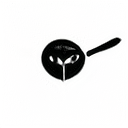

In [ ]:
_, images = generate_from_latents([latents_a], 0.7)
images[0]

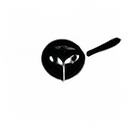

In [ ]:
# Fixed input example, with dlatents as intermediate
dlatents = Gs.components.mapping.run(latents_a, None)[0]
PIL.Image.fromarray(generate_images_from_dlatents(dlatents, 0.7))

In [ ]:
import cv2
im1 = cv2.imread('/content/drive/MyDrive/Junior Year/IW/Code/figures/blobs/200.png')
im2 = cv2.imread('/content/drive/MyDrive/Junior Year/IW/Code/figures/blobs/95.png')
im1 = Image.fromarray(im1)
im2 = Image.fromarray(im2)
yah = image_grid([im1, im2], 1, 2)
yah.save('/content/drive/MyDrive/Junior Year/IW/Code/figures/blobs/all.png')

In [ ]:
import os
import pickle
import numpy as np
import numpy.linalg as la

import PIL.Image
import PIL.ImageSequence

import moviepy
import moviepy.editor
import math
import glob
import csv
from functools import partial
import time
import collections
import copy

import sys
sys.path.append("stylegan2")

import run_projector
import projector
import dnnlib
import dnnlib.tflib as tflib
from PIL import Image

import tensorflow as tf

import keras
from keras.applications.vgg16 import VGG16, preprocess_input

from sklearn.linear_model import LogisticRegression, LinearRegression, Lasso, ElasticNet
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.decomposition import PCA

import colorsys
import re
import copy

from IPython.display import display, clear_output
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

import matplotlib.pyplot as plt
import glob
import gc
import io

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)1679360/45929032 bytes (3.7%)4882432/45929032 bytes (10.6%)8552448/45929032 bytes (18.6%)12230656/45929032 bytes (26.6%)16039936/45929032 bytes (34.9%)19881984/45929032 bytes (43.3%)23486464/45929032 bytes (51.1%)27172864/45929032 bytes (59.2%)30818304/45929032 bytes (67.1%)34414592/45929032 bytes (74.9%)38027264/45929032 bytes (82.8%)41787392/45929032 bytes (91.0%)

Using TensorFlow backend.


In [ ]:
%cat projector.py

## Projection

In [ ]:
##
# 3. Projection - encoding images into latent space
##
import run_projector
import projector
import imp
# imp.reload(projector)
# imp.reload(run_projector)

# proj = projector.Projector()
# proj.set_network(Gs)  

# Projects an image into dlatent space and returns the dlatents
def encode_image(image, steps=1000, verbose=True):
    image_processed = np.array(copy.deepcopy(image).convert('RGB').resize((512, 512), resample = PIL.Image.LANCZOS)) / 255.0
    image_processed = (image_processed.transpose(2, 0, 1) - 0.5) * 2.0
    image_processed = np.array([image_processed])

    proj.num_steps = steps
    proj.initial_learning_rate = 2
    proj.start(image_processed)
    while proj.get_cur_step() < steps:
        if verbose:
            print('\rProjection: Step %d / %d ... ' % (proj.get_cur_step(), steps), end='', flush=True)
        proj.step()
    print('\r', end='', flush=True)
    return proj.get_dlatents()

In [ ]:
projected_latents_dict = {}

In [ ]:
import pickle

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/projected_l2.pkl", "rb") as f:
  projected_latents_dict = pickle.load(f)

already done


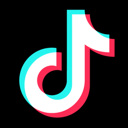

In [ ]:
image_name = "tiktok"
image = PIL.Image.open(f"/content/drive/MyDrive/stylegan2-colab/stylegan2/projection_images/{image_name}.png")
image = image.resize((128, 128))


if image_name in projected_latents_dict:
  print('already done')

display(image)

In [ ]:
# the path to the image you want to project
projected_latents_dict[image_name] = encode_image(image, 2000)

image_projected = generate_images_from_dlatents(projected_latents_dict[image_name], 1)
display(image)
display(Image.fromarray(image_projected))

Projection: Step 346 / 2000 ... 

In [ ]:
import pickle

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/projected_l2.pkl", "wb") as f:
  pickle.dump(projected_latents_dict, f)

In [ ]:
##
# 3. Modification - prepararing data for training dlatent dirs
##

# Generate samples to pass to the tagger model
def generate_one_for_latentdirs(truncation_psi = 0.7, randomize_noise = True):
    latents = np.random.randn(1, Gs.input_shape[1])
    dlatents = Gs.components.mapping.run(latents, None)[0]
    dlatents_trunc = truncate(dlatents, truncation_psi)
    fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    result_image = Gs.components.synthesis.run(
        dlatents_trunc.reshape((-1, 16, 512)),
        randomize_noise = randomize_noise,
        minibatch_size = 1,
        output_transform=fmt
    )[0]
    return latents, dlatents, result_image

# This gets slower as we go so lets go in steps of 100 to see if that alleviates the issue
# of course, this doesn't work, on account of my GPU memory being too small. minibatch 10, maybe?
# I want a ti 2080 11gb quite badly
def generate_many_for_latentdirs(truncation_psi = 0.7, randomize_noise = True):
    latents = np.random.randn(100, Gs.input_shape[1])
    dlatents = Gs.components.mapping.run(latents, None)
    dlatents_trunc = truncate(dlatents, truncation_psi)
    fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    result_image = Gs.components.synthesis.run(
        dlatents_trunc.reshape((-1, 16, 512)),
        randomize_noise = randomize_noise,
        minibatch_size = 10,
        output_transform=fmt
    )
    return latents, dlatents, result_image

## Projection Evaluation

In [ ]:
import pickle

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/projected_l2.pkl", "rb") as f:
  l2 = pickle.load(f)

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/projected_abs.pkl", "rb") as f:
  abs = pickle.load(f)

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/projected_regular.pkl", "rb") as f:
  regular = pickle.load(f)

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/projected_comb.pkl", "rb") as f:
  comb = pickle.load(f)

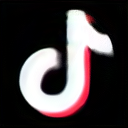

In [ ]:
regular_facebook = generate_images_from_dlatents(regular['tiktok'], 1)
display(Image.fromarray(comb_facebook))

In [ ]:
image_grid([image, Image.fromarray(regular_facebook), Image.fromarray(comb_facebook)], 1, 3).save('/content/drive/MyDrive/Junior Year/IW/Code/figures/tiktok_proj.png')

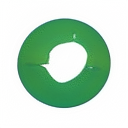

In [ ]:
# Distance from center
image_projected = generate_images_from_dlatents(Gs.get_var('dlatent_avg'), 0)
display(Image.fromarray(image_projected))

In [ ]:
x = [i for i in range(500)]
y = [(i / 500) / (1 - (i / 500)) for i in range(500)]

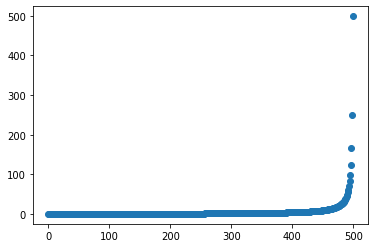

In [ ]:
plt.scatter(x, y)

In [ ]:
l2.keys()

dict_keys(['adobe', 'apple', 'beats', 'bmw', 'facebook', 'google', 'instagram', 'mercedes', 'microsoft', 'mitsubishi', 'nike', 'paypal', 'pepsi', 'princeton', 'snapchat', 'spotify', 'square', 'target', 'tiktok', 'twitter', 'uber', 'waze', 'youtube'])

In [ ]:
image_name = 'facebook'
print(np.linalg.norm(Gs.get_var('dlatent_avg') - l2[image_name]))
print(np.linalg.norm(Gs.get_var('dlatent_avg') - abs[image_name]))
print(np.linalg.norm(Gs.get_var('dlatent_avg') - regular[image_name]))
print(np.linalg.norm(Gs.get_var('dlatent_avg') - comb[image_name]))

655.3582
238.87518
365.42368
240.7162


In [ ]:
def geo_mean(iterable):
    a = np.array(iterable)
    return a.prod()**(1.0/len(a))

In [ ]:
from scipy.spatial.distance import euclidean
from skimage.metrics import structural_similarity as ssim

euclidean_list = []
structural_list = []
mse_list = []

dict_in_question = regular
for key in dict_in_question:
  image = PIL.Image.open(f"/content/drive/MyDrive/stylegan2-colab/stylegan2/projection_images/{key}.png")
  image1 = np.array(image.resize((128, 128)))
  if len(image1.shape) == 2:
    image1 = np.stack([image1, image1, image1], axis=2)
  if image1.shape[2] == 4:
    image1 = image1[:,:,:3]

  image2 = generate_images_from_dlatents(dict_in_question[key], 1)
  image1 = image1 / 255
  image2 = image2 / 255

  euclidean_list.append(euclidean(image1.flatten(), image2.flatten()))
  structural_list.append(ssim(image1, image2, data_range=image2.max() - image2.min(), multichannel=True))
  mse_list.append(np.mean(np.square(image1 - image2)))

NameError: ignored

In [ ]:
from scipy.spatial.distance import euclidean

# l2_array = np.asarray(l1_list)
mean_dist = np.mean(euclidean_list)
print(mean_dist)

mean_dist = np.mean(structural_list)
print(mean_dist)

mean_dist = np.mean(mse_list)
print(mean_dist)

51.47562019263015
0.7289396214033718
0.10143535528332887


In [ ]:
dist_list = []
dict_in_question = regular
for key in dict_in_question:
  dist = np.linalg.norm(Gs.get_var('dlatent_avg') - dict_in_question[key])
  dist_list.append(dist)

In [ ]:
dist_array = np.asarray(dist_list)
mean_dist = np.mean(dist_array)
print(mean_dist)

323.54608


In [ ]:
j = 5000
dist_list = []
for i in range(j, j+5000):
  seed = i
  rnd = np.random.RandomState(seed)
  z = rnd.randn(1, *Gs.input_shape[1:])
  w = Gs.components.mapping.run(z, None)[0]
  
  dist = np.linalg.norm(Gs.get_var('dlatent_avg') - w)
  dist_list.append(dist)

In [ ]:
dist_array = np.asarray(dist_list)
mean_dist = np.mean(dist_array)
print(mean_dist)
print(np.exp(np.mean(np.log(dist_array))))

65.637924
64.64342


## Learn Directions

In [ ]:
def make_latent_interp_img(save_path, seed, num_interps, direction, parameters, scale, one_direction=False, save=False):
    start, end, mult = parameters
    
    step_size = 1/num_interps
      
    amounts = np.arange(0, 1, step_size)
    amounts = np.arange((-len(amounts) // 2) + 1, (len(amounts) // 2) + 1)

    canvas = Image.new('RGB', (128 * num_interps, 128), 'white')

    for i, j in enumerate(amounts):
        move = j
        if one_direction:
          move = i

        final_im = return_sample(seed, 0.7, mult * direction, move, scale, start, end, disp=True, save=None, noise_spec=None)

        canvas.paste(final_im, (128 * i, 0))
    
    if save:
      save_name = output_imgs_path/save_path 
      canvas.save(save_name)

    return canvas

def return_sample(seed, truncation, direction, distance, scale, start, end, disp=True, save=None, noise_spec=None):
      rnd = np.random.RandomState(seed)
      w = rnd.randn(1, *Gs.input_shape[1:])

      dlatents = Gs.components.mapping.run(w, None)[0]

      for l in range(start, end):
        dlatents[l] = dlatents[l] + direction * distance * scale

      image = generate_images_from_dlatents([dlatents])
      return Image.fromarray(image)
  
# We have to do truncation ourselves, since we're not using the combined network
def truncate(dlatents, truncation_psi, maxlayer = 12):
    dlatent_avg = tf.get_default_session().run(Gs.own_vars["dlatent_avg"])
    layer_idx = np.arange(12)[np.newaxis, :, np.newaxis]
    ones = np.ones(layer_idx.shape, dtype=np.float32)
    coefs = tf.where(layer_idx < maxlayer, truncation_psi * ones, ones)
    return tf.get_default_session().run(tflib.lerp(dlatent_avg, dlatents, coefs))

# Generate image with disentangled latents as input
def generate_images_from_dlatents(dlatents, truncation_psi = 0.7, randomize_noise = False):
    if not truncation_psi is None:
        dlatents_trunc = truncate(dlatents, truncation_psi)
    else:
        dlatents_trunc = dlatents
        
    # Run the network
    fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    result_image = Gs.components.synthesis.run(
        dlatents_trunc.reshape((-1, 12, 512)),
        randomize_noise = randomize_noise,
        minibatch_size = 1,
        output_transform=fmt
    )[0]
    return result_image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [ ]:
np.random.seed(10)
all_seeds = np.random.randint(10000000, size=(num_images))

NameError: ignored

In [ ]:
# Create dataset
latents = []
num_images = 20000

np.random.seed(10)
all_seeds = np.random.randint(10000000, size=(num_images))

all_z = np.stack([np.random.RandomState(seed).randn(*Gs.input_shape[1:]) for seed in all_seeds]) # [minibatch, component]

In [ ]:
del all_seeds

In [ ]:
# Generate images

fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
images = np.zeros((num_images, 128, 128, 3))

for i in range(num_images):
  images[i] = Gs.run(np.stack([all_z[i]]), None, **Gs_kwargs)

images.shape

In [ ]:
import pickle

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/images.npy", "rb") as f:
  images = np.load(f)

In [ ]:
import pickle

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/images.npy", "wb") as f:
  np.save(f, images)

In [ ]:
def rgb2hsv(rgb):
    """ convert RGB to HSV color space

    :param rgb: np.ndarray
    :return: np.ndarray
    """

    rgb = rgb.astype('float')
    maxv = np.amax(rgb, axis=2)
    maxc = np.argmax(rgb, axis=2)
    minv = np.amin(rgb, axis=2)
    minc = np.argmin(rgb, axis=2)

    hsv = np.zeros(rgb.shape, dtype='float')
    hsv[maxc == minc, 0] = np.zeros(hsv[maxc == minc, 0].shape)
    hsv[maxc == 0, 0] = (((rgb[..., 1] - rgb[..., 2]) * 60.0 / (maxv - minv + np.spacing(1))) % 360.0)[maxc == 0]
    hsv[maxc == 1, 0] = (((rgb[..., 2] - rgb[..., 0]) * 60.0 / (maxv - minv + np.spacing(1))) + 120.0)[maxc == 1]
    hsv[maxc == 2, 0] = (((rgb[..., 0] - rgb[..., 1]) * 60.0 / (maxv - minv + np.spacing(1))) + 240.0)[maxc == 2]
    hsv[maxv == 0, 1] = np.zeros(hsv[maxv == 0, 1].shape)
    hsv[maxv != 0, 1] = (1 - minv / (maxv + np.spacing(1)))[maxv != 0]
    hsv[..., 2] = maxv

    return hsv

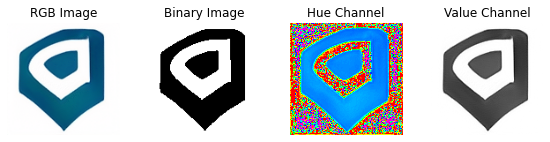

In [ ]:
rgb_img = images[1] / 255
hsv_img = rgb2hsv(rgb_img)
hue_img = hsv_img[:, :, 0]
value_img = hsv_img[:, :, 2]

img_uint8 = np.uint8(images[1])
gray = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)
gray, img_bin = cv2.threshold(gray,128,255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)
binary = cv2.bitwise_not(img_bin) / 255

fig, (ax0, ax1, ax2, ax3) = plt.subplots(ncols=4, figsize=(8, 2))

ax0.imshow(rgb_img)
ax0.set_title("RGB Image")
ax0.axis('off')
ax1.imshow(binary, cmap='Greys')
ax1.set_title("Binary Image")
ax1.axis('off')
ax2.imshow(hue_img, cmap='hsv')
ax2.set_title("Hue Channel")
ax2.axis('off')
ax3.imshow(value_img, cmap='gray')
ax3.set_title("Value Channel")
ax3.axis('off')

fig.tight_layout()
plt.savefig("/content/drive/MyDrive/Junior Year/IW/Code/figures/hsv.png")

In [ ]:
from skimage import data
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.feature import corner_harris, corner_peaks
from skimage.color import rgb2gray
from math import sqrt

import matplotlib.pyplot as plt

def num_corners(image):
  image_gray = rgb2gray(image)

  return corner_peaks(corner_harris(image_gray), min_distance=1).shape[0]

def num_blobs(image):
  blobs = blob_dog(image, min_sigma=1, max_sigma=30, threshold=.01, exclude_border=True)

  return blobs.shape[0]

In [ ]:
# RGB PERCENTAGE CONTRIBUTION
def rgb_percentage_contribution(images, num_images, channel):
  tags = np.zeros((num_images))

  channels = [0, 1, 2]
  channels.remove(channel)

  for i in range(num_images):
    denom = images[i, :, :].sum()
    p1 = images[i, :, :, channel].sum() / denom
    p2 = images[i, :, :, channels[0]].sum() / denom
    p3 = images[i, :, :, channels[1]].sum() / denom
    if p1 > p2 and p1 > p3:
      tags[i] = 1
    
  return tags

red_tags = rgb_percentage_contribution(images, num_images=20000, channel=0)
green_tags = rgb_percentage_contribution(images, num_images=20000, channel=1)
blue_tags = rgb_percentage_contribution(images, num_images=20000, channel=2)

In [ ]:
red_seeds = all_seeds[red_tags==1]
green_seeds = all_seeds[green_tags==1]
blue_seeds = all_seeds[blue_tags==1]
black_seeds = all_seeds[black_tags==1]

In [ ]:
red_z = all_z[red_tags==1]
blue_z = all_z[blue_tags == 1]

In [ ]:
import pickle

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/seeds/blue_hsv_seeds.pkl", "wb") as f:
  pickle.dump(blue_seeds, f)

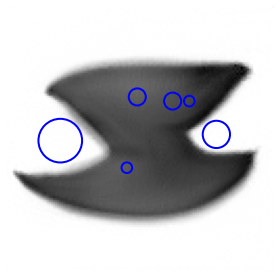

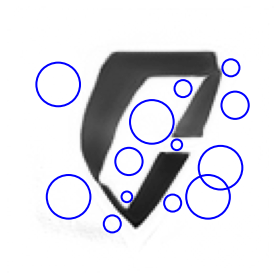

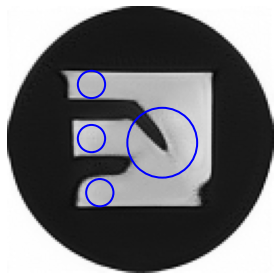

In [ ]:
from skimage import data
from skimage.feature import blob_dog, blob_log, blob_doh
from math import sqrt
import cv2

import matplotlib.pyplot as plt

def num_blobs(image, i):
  blobs = blob_dog(image, min_sigma=1, max_sigma=100, threshold=.01, exclude_border=True)

  blobs_list = [blobs]
  colors = ['yellow']
  titles = ['Laplacian of Gaussian']
  sequence = zip(blobs_list, colors, titles)

  fig, ax =plt.subplots(ncols=1, sharex=True, sharey=True)

  ax.imshow(image, cmap='gray')
  for blob in blobs:
      y, x, r = blob
      c = plt.Circle((x, y), r, color='blue', linewidth=2, fill=False)
      ax.add_patch(c)
  ax.set_axis_off()

  plt.tight_layout()
  plt.savefig('/content/drive/MyDrive/Junior Year/IW/Code/figures/blobs/'+str(i)+'.png')
  plt.show()

  return Image.fromarray(image)

# COMPLEXITY BLOB THRESHOLDING
def blob_thresholding(images, num_images):
  tags = np.zeros((num_images))
  length = images[0].shape[0]
  indices = [119, 200, 95]
  display_images = []

  for i in range(num_images):
    i = indices[i] 
    image = rgb2hsv(images[i])

    img_uint8 = np.uint8(images[i])
    gray = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)
    _, img_bin = cv2.threshold(gray,128,255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    binary = cv2.bitwise_not(img_bin) / 255

    blob_count = num_blobs(gray, i)
    display_images.append(blob_count)
    
  return tags

complexity_tags_raw = blob_thresholding(images, num_images=3)

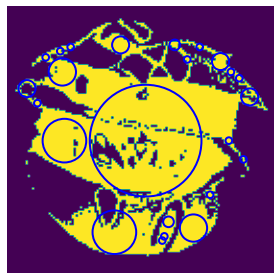

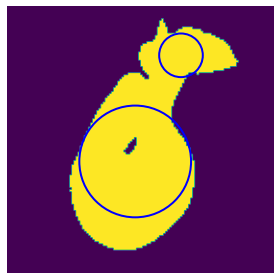

In [ ]:
from skimage import data
from skimage.feature import blob_dog, blob_log, blob_doh
from math import sqrt

import matplotlib.pyplot as plt

def num_blobs(image):
  blobs = blob_dog(image, min_sigma=1, max_sigma=100, threshold=.01, exclude_border=True)

  # blobs_list = [blobs]
  # colors = ['yellow']
  # titles = ['Laplacian of Gaussian']
  # sequence = zip(blobs_list, colors, titles)

  # fig, ax =plt.subplots(ncols=1, sharex=True, sharey=True)

  # ax.imshow(image)
  # for blob in blobs:
  #     y, x, r = blob
  #     c = plt.Circle((x, y), r, color='blue', linewidth=2, fill=False)
  #     ax.add_patch(c)
  # ax.set_axis_off()

  # plt.tight_layout()
  # plt.show()

  return blobs.shape[0]

# COMPLEXITY BLOB THRESHOLDING
def blob_thresholding(images, num_images):
  tags = np.zeros((num_images))
  length = images[0].shape[0]

  for i in range(num_images):
    image = rgb2hsv(images[i])

    img_uint8 = np.uint8(images[i])
    gray = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)
    _, img_bin = cv2.threshold(gray,128,255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    binary = cv2.bitwise_not(img_bin) / 255

    blob_count = num_blobs(binary)
    tags[i] = blob_count
  
  return tags

complexity_tags_raw = blob_thresholding(images, num_images=20000)

In [ ]:
complexity_tags = np.zeros(np.shape(complexity_tags_raw)[0])
complexity_tags[complexity_tags_raw > 13] = 1
complexity_tags[complexity_tags == 1].shape

(3718,)

In [ ]:
complexity_seeds = all_seeds[complexity_tags==1]
complexity_seeds.shape

(3718,)

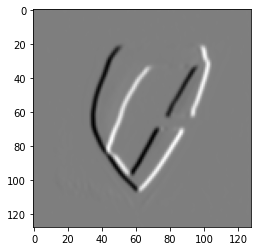

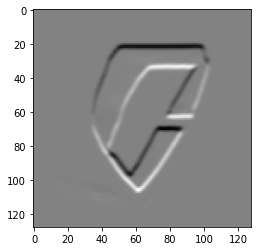

516.0734648506229


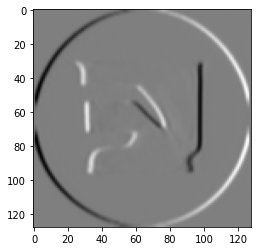

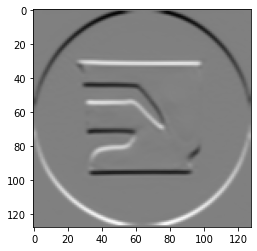

1015.1375973631004


In [ ]:
import cv2
# COMPLEXITY SPATIAL INFORMATION
def spatial_information(images, num_images):
  tags = np.zeros((num_images))
  length = images[0].shape[0]
  indices = [200, 95]

  for i in range(num_images):
    i = indices[i]
    img_uint8 = np.uint8(images[i])
    gray = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)

    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=5)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=5) 

    plt.imshow(sobelx, cmap='gray')
    plt.show()
    plt.imshow(sobely, cmap='gray')
    plt.show()

    x_s = np.square(sobelx)
    y_s = np.square(sobely)
    si = np.sqrt(x_s + y_s)
    si_mean = np.mean(si)
    # tags[i] = si_mean

    print(si_mean)

  return tags

complexity_tags_raw = spatial_information(images, num_images=2)

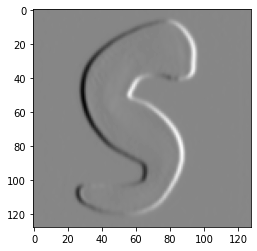

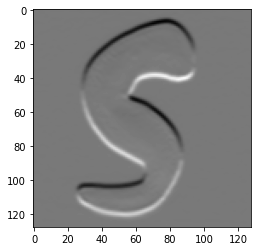

In [ ]:
import cv2
# COMPLEXITY SPATIAL INFORMATION
def spatial_information(images, num_images):
  tags = np.zeros((num_images))
  length = images[0].shape[0]

  for i in range(num_images):
    img_uint8 = np.uint8(images[i])
    gray = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)

    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=5)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=5) 

    # plt.imshow(sobelx, cmap='gray')
    # plt.show()
    # plt.imshow(sobely, cmap='gray')
    # plt.show()

    x_s = np.square(sobelx)
    y_s = np.square(sobely)
    si = np.sqrt(x_s + y_s)
    si_mean = np.mean(si)
    tags[i] = si_mean

  return tags

complexity_tags_raw = spatial_information(images, num_images=20000)

In [ ]:
complexity_tags = np.zeros(np.shape(complexity_tags_raw)[0])
complexity_tags[complexity_tags_raw > 900] = 1
complexity_tags[complexity_tags == 1].shape

(6166,)

In [ ]:
import pickle

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/seeds/complexity_seeds.pkl", "wb") as f:
  pickle.dump(complexity_seeds, f)

In [ ]:
# HSV Maximum Quantity
def hsv_maximum_quantity(images, num_images):
  red_tags = np.zeros((num_images))
  green_tags = np.zeros((num_images))
  blue_tags = np.zeros((num_images))
  black_tags = np.zeros((num_images))
  white_tags = np.zeros((num_images))

  for i in range(num_images):
    image = rgb2hsv(images[i])

    img_uint8 = np.uint8(images[i])
    gray = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)
    gray, img_bin = cv2.threshold(gray,128,255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    binary = cv2.bitwise_not(img_bin) / 255

    h = image[:,:,0]
    s = image[:,:,1]
    v = image[:,:,2]    

    num_black = len(v[v < 10])
    num_white = len(v[v > 250 & (binary != 0)])
    num_red = len(h[(h > 330) | (h < 30) & (binary != 0)])
    num_blue = len(h[(h > 210) & (h < 270) & (binary != 0)])
    num_green = len(h[(h > 90) & (h < 150) & (binary != 0)])

    if num_red > num_green and num_red > num_blue and num_red > num_black:
      red_tags[i] = 1
    if num_green > num_red and num_green > num_blue and num_green > num_black:
      green_tags[i] = 1
    if num_blue > num_green and num_blue > num_red and num_blue > num_black:
      blue_tags[i] = 1
    if num_black > num_green and num_black > num_red and num_black > num_blue:
      black_tags[i] = 1
    if num_white > num_green and num_white > num_red and num_white > num_blue and num_white > num_black:
      tags[i] = 1
    
  return red_tags, green_tags, blue_tags, black_tags, white_tags

red_tags, green_tags, blue_tags, black_tags, white_tags = hsv_maximum_quantity(images, num_images=20000)

In [ ]:
black_tags[white_tags==1].shape

(0,)

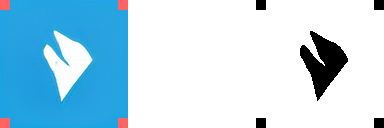

In [ ]:
# SIZE FILLED CORNER PIXELS
def filled_corner_pixels(images, num_images):
  tags = np.zeros((num_images))
  length = images[0].shape[0]

  for i in range(num_images):
    img_uint8 = np.uint8(images[104])
    gray = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)
    gray, img_bin = cv2.threshold(gray,128,255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    binary = cv2.bitwise_not(img_bin) / 255

    radius = 10
    top_left = binary[0:radius, 0:radius].sum()
    bottom_left = binary[length-radius:length, 0:radius].sum()
    bottom_right = binary[length-radius:length, length-radius:length].sum()
    top_right = binary[0:radius, length-radius:length].sum()

    binary[0:radius, 0:radius] = 0
    binary[length-radius:length, 0:radius] =0
    binary[length-radius:length, length-radius:length] = 0
    binary[0:radius, length-radius:length] = 0

    img_uint8[0:radius, 0:radius] = [255, 100, 100]
    img_uint8[length-radius:length, 0:radius] = [255, 100, 100]
    img_uint8[length-radius:length, length-radius:length] =  [255, 100, 100]
    img_uint8[0:radius, length-radius:length] = [255, 100, 100]

    # plt.imshow(binary, cmap='gray')
    # plt.axis('off')
    # plt.savefig('/content/drive/MyDrive/Junior Year/IW/Code/figures/corner_label.png')
    # plt.show()
    grid = image_grid([Image.fromarray(img_uint8), Image.fromarray(np.ones((128,128))*255), Image.fromarray(binary * 255)], 1, 3)
    display(grid)
    grid.save('/content/drive/MyDrive/Junior Year/IW/Code/figures/corner_label.png')

    if (top_left + bottom_left + bottom_right + top_right) > radius * 4:
      tags[i] = 1
  
  return tags

size_tags = filled_corner_pixels(images, num_images=1)

In [ ]:
background_color_seeds = all_seeds[filled_tags==1]
background_color_seeds.shape

(3358,)

In [ ]:
background_color_seeds[0]

840036

In [ ]:
import pickle

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/seeds/background_color_seeds.pkl", "wb") as f:
  pickle.dump(background_color_seeds, f)

In [ ]:
# SIZE GRAYSCALE THRESHOLDING
def binary_thresholding(images, num_images):
  tags = np.zeros((num_images))
  length = images[0].shape[0]

  # mostly white tag
  for i in range(num_images):
    hsv = rgb2hsv(images[i])

    white_ratio = hsv[:,:,2].sum() / (length * length * 255)

    if white_ratio > 0.95:
      tags[i] = 1

  return tags

def binary_thresholding(images, num_images):
  tags = np.zeros((num_images))
  length = images[0].shape[0]

  # mostly white tag
  for i in range(num_images):
    img_uint8 = np.uint8(images[i])

    gray = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)
    gray, img_bin = cv2.threshold(gray,128,255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    binary = cv2.bitwise_not(img_bin) / 255

    white_ratio = len(binary[binary==0]) / (128*128)
    if white_ratio > .85:
      tags[i] = 1

  return tags

size_tags = binary_thresholding(images, num_images=20000)

In [ ]:
def np_hist_to_cv(np_histogram_output):
    counts, bin_edges = np_histogram_output
    return counts.ravel().astype('float32')

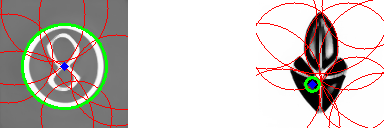

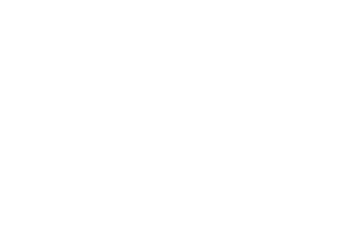

In [ ]:
import cv2
from scipy.spatial import distance_matrix

def hough_circle_thresholding(images, num_images):
  tags = np.zeros((num_images))
  length = images[0].shape[0]
  show_images = []
  indices = [24, 30]

  for i in range(num_images):
    i = indices[i]
    og_im = np.uint8(images[i])
    img = cv2.cvtColor(og_im, cv2.COLOR_RGB2GRAY)
    img = cv2.medianBlur(img,5)
    cimg = cv2.cvtColor(img,cv2.COLOR_GRAY2BGR)

    circles = cv2.HoughCircles(img,cv2.HOUGH_GRADIENT,1,40,
                                param1=10,param2=10,minRadius=0,maxRadius=128)

    if circles is None:
      # tags[i] = 0
      print('hi')
      continue

    circles = np.uint16(np.around(circles))
    centers = np.zeros((circles.shape[1],2))
    centers[:] = 128 //2
    distances_to_center = np.linalg.norm(circles[0,:,:2] - centers, axis=1)
    
    j = distances_to_center.argmin()
    circle = circles[0, j]
    # tags[i] = circle[2]

    circles = np.uint16(np.around(circles))
    for count, k in enumerate(circles[0,:]):
        if count == j:
          continue
        # draw the outer circle
        cv2.circle(cimg,(k[0],k[1]),k[2],(255,0,0),1)
        # draw the center of the circle
        # cv2.circle(cimg,(k[0],k[1]),2,(0,255,0),1)

    i = circles[0, j]
    # draw the outer circle
    cv2.circle(cimg,(i[0],i[1]),i[2],(0,255,0),2)
    # draw the center of the circle
    cv2.circle(cimg,(i[0],i[1]),2,(0,0,255),3)

    plt.rcParams.update({'font.size': 14})
    # plt.text(40, 40, f'r = {i[2]}')
    plt.axis('off')
    show_images.append(Image.fromarray(cimg))

    # plt.imshow(cimg)
    # plt.show()
  show_images.append(Image.fromarray(np.ones((128,128))*255))
  yah = image_grid([show_images[0],show_images[2], show_images[1]] , 1, 3)
  display(yah)
  yah.save('/content/drive/MyDrive/Junior Year/IW/Code/figures/hough.png')
  return tags

size_tags_raw = hough_circle_thresholding(images, 2)

In [ ]:
filled_tags = filled_corner_pixels(images, num_images=20000)

In [ ]:
thresholding_tags = binary_thresholding(images, num_images=20000)

In [ ]:
size_tags = np.zeros(np.shape(size_tags_raw)[0])
size_tags[size_tags_raw > 50] = 1
size_tags[size_tags == 1].shape

(4395,)

In [ ]:
size_tags[filled_tags == 1] = 1
size_tags[size_tags == 1].shape

(7316,)

In [ ]:
size_tags[(size_tags == 1) & (thresholding_tags == 1)] = 0
size_tags[size_tags == 1].shape

(7233,)

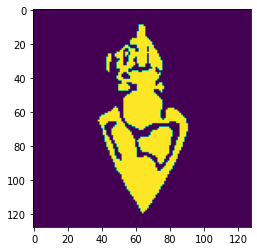

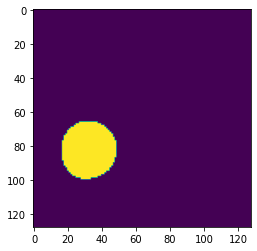

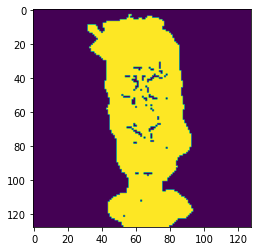

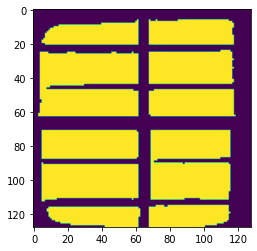

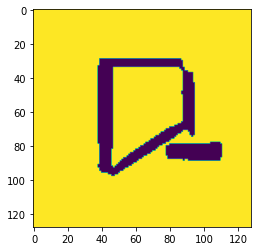

...

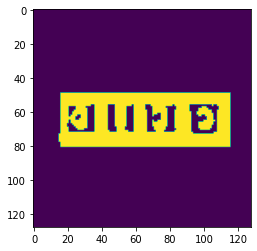

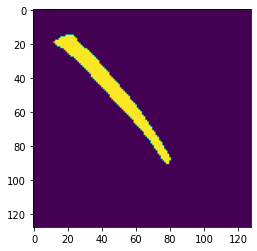

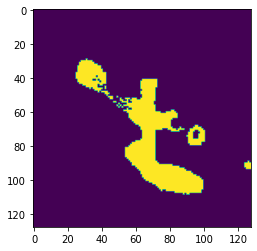

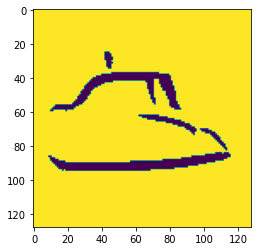

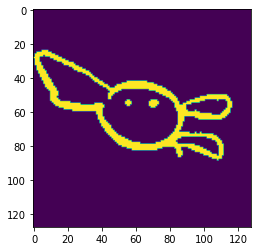

In [ ]:
# SHAPE SYMMETRY
def binary_split_comparison(images, num_images):
  tags = np.zeros((num_images))
  length = images[0].shape[0]
  width_cutoff = length // 2

  # mostly white tag
  for i in range(num_images):
    img_uint8 = np.uint8(images[i])

    gray = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)
    gray, img_bin = cv2.threshold(gray,128,255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    binary = cv2.bitwise_not(img_bin) / 255

    # split image in half
    s1 = binary[:, :width_cutoff]
    s2 = binary[:, width_cutoff:]

    num_overlap = len(s1[(s1 == 1) & (s2 == 1)])
    num_overlap += len(s1[(s1 == 0) & (s2 == 0)])
    total = 128 * 128
    if (num_overlap / total) > .4:
      tags[i] = 1
        
    s1 = binary[:width_cutoff, :]
    s2 = binary[width_cutoff:, :]

    num_overlap = len(s1[(s1 == 1) & (s2 == 1)])
    num_overlap += len(s1[(s1 == 0) & (s2 == 0)])
    total = 128 * 128
    if (num_overlap / total) > .4:
      tags[i] = 1
    
    if tags[i] == 1:
      plt.imshow(binary)
      plt.show()
          
    
  return tags

symmetry_tags = binary_split_comparison(images, num_images=100)

In [ ]:
symmetry_tags

array([1.])

In [ ]:
symmetry_tags.shape

(20000,)

In [ ]:
symmetry_tags[symmetry_tags==1].shape

(5223,)

In [ ]:
symmetry_seeds = all_seeds[symmetry_tags==1]

In [ ]:
import pickle

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/seeds/symmetry_seeds.pkl", "wb") as f:
  pickle.dump(symmetry_seeds, f)

In [ ]:
import pickle

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/supervised_dict.pkl", "rb") as f:
  supervised_dict = pickle.load(f)

In [ ]:
supervised_dict.keys()

dict_keys(['red_rgb_percentage_contribution', 'blue_rgb_percentage_contribution', 'green_rgb_percentage_contribution', 'red_hsv_maximum_quantity', 'green_hsv_maximum_quantity', 'blue_hsv_maximum_quantity', 'black_hsv_maximum_quantity', 'size_filled_corner_pixels', 'size_binary_thresholding', 'symmetry_binary_split_comparison', 'complexity_blob_thresholding', 'complexity_spatial_information', 'size_hough_circles'])

In [ ]:
import pickle

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/supervised_dict.pkl", "wb") as f:
  pickle.dump(supervised_dict, f)

In [ ]:
good_seeds = [391049438, 812988239, 864684474, 169869150, 1821476060, 1736720173, 1388122245, 470455603, 109205828, 
              1466675128, 810863819, 172582121, 227593680, 297356458, 350606507,
              1428287491, 843, 145, 5310, 3967, 389746, 2124813335, 1444062920, 1651583255,
              715622503, 130814676, 57, 20, 670, 3345, 33457, 137, 138, 812988233, 32353, 8469015,
              1723225816, 196525129, 57873533, 1513149282, 1967834917, 418002533, 1442228425, 1193347417,
              130029044, 198562280, 1093333447, 1611767532, 1556421108, 684367779, 1922093669, 
              1370174848, 1540350065, 1706219851, 537009070, 908536436, 1716616451, 295283057, 842246229,
              1356768744, 195488666, 1294954460, 2502608, 349442220, 740312126, 1252333816, 1021847599, 
              1113669133, 1917592453, 1052444511, 446373871, 125393091, 1198508016, 1399116885, 1224077971, 
              1726114719, 994796117, 1306037308, 1860705326, 1259247846, 872237283, 889028859, 68870, 
              6163011, 9761915, 2316994, 4406784, 1478901, 1099883, 5762883, 669401, 8233848, 
              1411392, 9721645, 7909081, 6627487, 4256231, 7437617, 2505165,4810889
              ]

good_images = []
rows = 10
cols = 10
for i in range(rows * cols):
  im = generate_from_seeds([good_seeds[i]])[0][0]
  im = np.uint8(im)
  good_images.append(Image.fromarray(im))

In [ ]:
labeled_images_ex = []

tags = size_tags

rows = 10
cols = 10
for i in range(rows * cols):
  im = np.uint8(images[tags==1][i])
  labeled_images_ex.append(Image.fromarray(im))

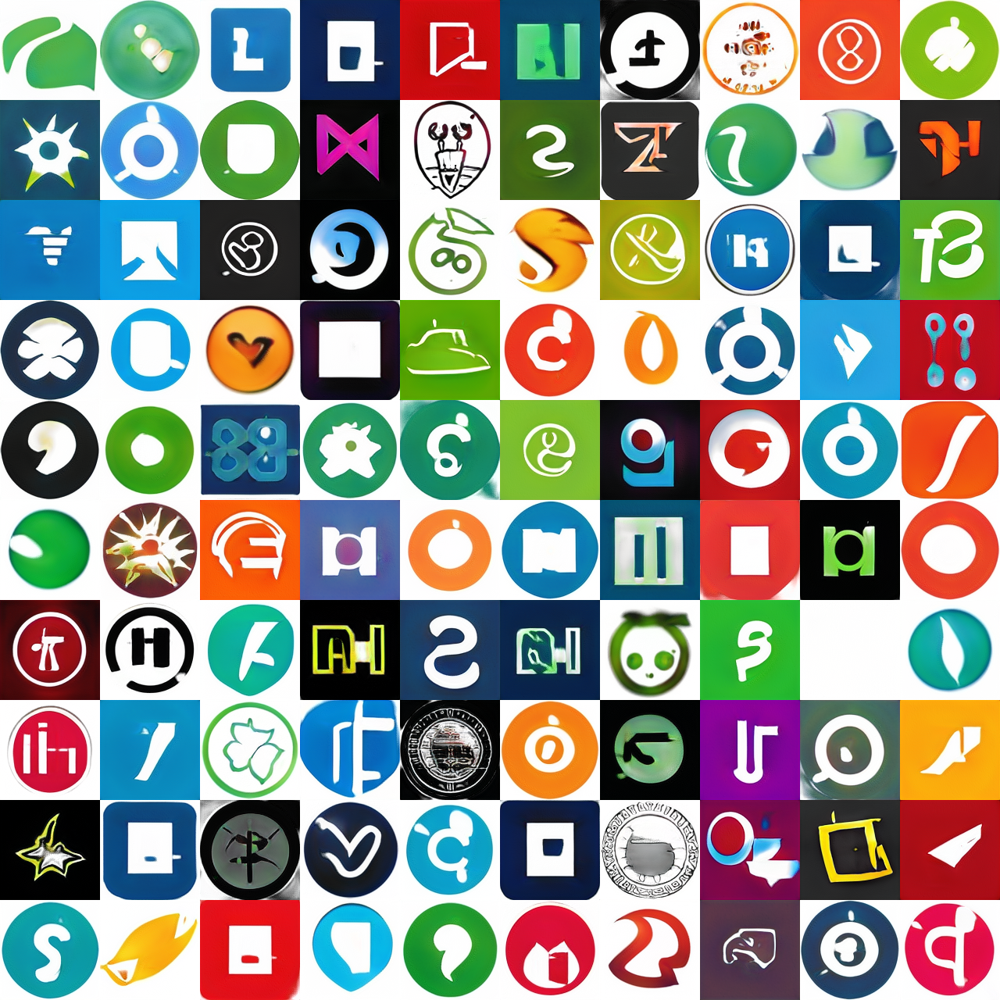

In [ ]:
file = "hough_circle_label.png"
label_type = "size"
grid = image_grid(labeled_images_ex, rows, cols)
# grid.save(f"/content/drive/MyDrive/Junior Year/IW/Code/supervised_feature_figures/{label_type}/{file}")
grid

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(all_z, size_tags, test_size=0.2)

In [ ]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

# Learn directions for tags (binarized) using logistic regression classification
# Thought: Why not apply L1 regu here to enforce sparsity?
# -> I feel this has neither improved nor worsened the situation (default settings)
# -> With really extreme sparsity constraint, it does, not work very well. Is my assumption that dlatents should be
#    sparse wrt tags wrong? Probably is.
# -> For now, plain logistic regression gives best results
def find_direction_binary(X_train, X_test, y_train, y_test):
    # clf = LogisticRegression(penalty="l1", solver="liblinear", max_iter=1000, C=0.001).fit(dlatents, targets)
    # clf = LogisticRegression(C=0.001, class_weight={0: len(y_test[y_test==1])/len(y_test), 1: len(y_test[y_test==0])/len(y_test)}).fit(X_train, y_train)
    clf = LogisticRegression(penalty="elasticnet", l1_ratio=0.5, solver="saga", C=10, class_weight={0: len(y_test[y_test==1])/len(y_test), 1: len(y_test[y_test==0])/len(y_test)}).fit(X_train, y_train)
    zero = clf.score(X_test[y_test==0], y_test[y_test==0]) * 100
    one = clf.score(X_test[y_test==1], y_test[y_test==1]) * 100
    print(f"0 label: {np.round(zero, 1)}")
    print(f"1 label: {np.round(one, 1)}")

    y_pred = clf.predict(X_test)

    a = accuracy_score(y_test, y_pred) * 100
    f = f1_score(y_test, y_pred, average="macro") * 100
    p = precision_score(y_test, y_pred, average="macro") * 100
    r = recall_score(y_test, y_pred, average="macro") * 100

    # print(f'accuracy: {np.round(a, 1)}')
    print(f'f1 score: {np.round(f, 1)}')
    print(f'precision: {np.round(p, 1)}')
    print(f'recall: {np.round(r, 1)}') 

    return clf.coef_.reshape(1,512)

In [ ]:
# Learn

direction = np.expand_dims(find_direction_binary(X_train, X_test, y_train, y_test), axis=0)

0 label: 81.7
1 label: 78.3
f1 score: 79.5
precision: 79.1
recall: 80.0


In [ ]:
# Get unit direction
unit_direction = direction / np.linalg.norm(direction)

In [ ]:
named_directions = {
    'fill': [0, 6, 12, -1],
    'background_color': [0, 0, 6, 1],
    'red_green': [1, 8, 12, 1],
    'orange_blue': [4, 8, 12, 1],
    'black_red': [6, 8, 12, 1],
    'black_blue': [2, 8, 12, -1],
    'square_circular': [2, 0, 5, 1],
    'size_supervised': [79, 0, 5, -1],
    'blue_red_supervised': [79, 8, 12, 1]
    }

In [ ]:
supervised_dict['size_hough_circles'] = [unit_direction, [0, 6, 1]]

In [ ]:
output_imgs_path = Path(ROOT, 'ganspace', 'complexity')
# Make Output Gifs folder if it doesn't exist.
if not output_imgs_path.exists():
    output_imgs_path.mkdir()

In [ ]:
good_seeds = [391049438, 812988239, 864684474, 169869150, 1821476060, 1736720173, 1388122245, 470455603, 109205828, 
              1466675128, 810863819, 172582121, 227593680, 297356458, 350606507,
              1428287491, 843, 145, 5310, 3967, 389746, 2124813335, 1444062920, 1651583255,
              715622503, 130814676, 57, 20, 670, 3345, 33457, 137, 138, 812988233, 32353, 8469015,
              1723225816, 196525129, 57873533, 1513149282, 1967834917, 418002533, 1442228425, 1193347417,
              130029044, 198562280, 1093333447, 1611767532, 1556421108, 684367779, 1922093669, 
              1370174848, 1540350065, 1706219851, 537009070, 908536436, 1716616451, 295283057, 842246229,
              1356768744, 195488666, 1294954460, 2502608, 349442220, 740312126, 1252333816, 1021847599, 
              1113669133, 1917592453, 1052444511, 446373871, 125393091, 1198508016, 1399116885, 1224077971, 
              1726114719, 994796117, 1306037308, 1860705326, 1259247846, 872237283, 889028859, 68870, 
              6163011, 9761915, 2316994, 4406784, 1478901, 1099883, 5762883, 669401, 8233848, 
              1411392, 9721645, 7909081, 6627487, 4256231, 7437617, 2505165,4810889, 5118905,4130511,
              8363717, 5605210, 9974734,6708912, 6778971, 1985516, 8490175, 3917031,8418053,
              3551408, 9454108, 4914523
              ]

In [ ]:
9454108, 1478901

363253


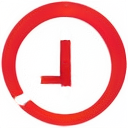

In [ ]:
seed = np.random.randint(7909081)
print(seed)
display(Image.fromarray(generate_from_seeds([seed])[0][0]))

In [ ]:
def linear_interpolate_w(w1, w2, shape_alpha, color_alpha):
  w1 = w1.squeeze()
  w2 = w2.squeeze()
  result_w = np.zeros(w1.shape)

  # shape features
  for layer in range(0, 8):
      result_w[layer] = w2[layer] * shape_alpha + w1[layer] * (1 - shape_alpha)
  
  for layer in range(8, 12):
      result_w[layer] = w2[layer] * color_alpha + w1[layer] * (1 - color_alpha)

  return result_w

In [ ]:
def z_to_w(z):
    w = Gs.components.mapping.run(z, None)[0]
    return w

In [ ]:
def generate_image_from_w(dlatents, truncation_psi = 0.7, randomize_noise = False):
    if not truncation_psi is None:
        dlatents_trunc = truncate(dlatents, truncation_psi)
    else:
        dlatents_trunc = dlatents
        
    # Run the network
    fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    result_image = Gs.components.synthesis.run(
        dlatents_trunc.reshape((-1, 12, 512)),
        randomize_noise = randomize_noise,
        minibatch_size = 1,
        output_transform=fmt
    )[0]
    return result_image

In [ ]:
comb.keys()

dict_keys(['apple', 'adobe', 'microsoft', 'beats', 'bmw', 'facebook', 'google', 'instagram', 'mercedes', 'mitsubishi', 'nike', 'paypal', 'pepsi', 'princeton', 'snapchat', 'spotify', 'square', 'target', 'tiktok', 'twitter', 'uber', 'waze', 'youtube'])

In [ ]:
from scipy.spatial.distance import euclidean

In [ ]:
Gs.get_var('dlatent_avg').shape

(512,)

In [ ]:
avg_w = z_to_w(np.expand_dims(Gs.get_var('dlatent_avg'), 0))
distances = []
yaga = comb

for i in yaga:
  dist = np.mean(euclidean(yaga[i].flatten(), avg_w.flatten()))
  distances.append(dist)
  print(i, dist)

apple 315.2442626953125
adobe 404.2764892578125
microsoft 446.4580078125
beats 236.1189727783203
bmw 370.9334716796875
facebook 244.09445190429688
google 362.6363830566406
instagram 474.83807373046875
mercedes 291.419921875
mitsubishi 337.4170227050781
nike 280.6923522949219
paypal 331.4852600097656
pepsi 378.6213684082031
princeton 375.248046875
snapchat 270.78399658203125
spotify 257.7127685546875
square 275.49261474609375
target 214.7318878173828
tiktok 325.37158203125
twitter 263.6583251953125
uber 193.10528564453125
waze 235.8946533203125
youtube 292.9353942871094


In [ ]:
avg_w = z_to_w(np.expand_dims(Gs.get_var('dlatent_avg'), 0))
distances = []
yaga = regular

for i in yaga:
  dist = np.mean(euclidean(yaga[i].flatten(), avg_w.flatten()))
  distances.append(dist)
  print(i, dist)

adobe 419.3963317871094
apple 302.7186279296875
beats 220.53514099121094
bmw 306.9088439941406
facebook 368.2921142578125
google 323.9849853515625
instagram 457.69195556640625
mercedes 282.1980895996094
microsoft 462.5776672363281
mitsubishi 232.2029266357422
nike 141.19497680664062
paypal 376.38751220703125
pepsi 308.4466552734375
princeton 359.5156555175781
snapchat 395.2322998046875
spotify 219.70314025878906
square 278.460693359375
target 216.1425323486328
tiktok 421.60821533203125
twitter 331.5147705078125
uber 374.67315673828125
waze 416.3502197265625
youtube 330.69439697265625


In [ ]:
np.mean(distances)

387.3199184251868

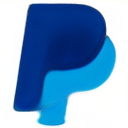

In [ ]:
w_hat = linear_interpolate_w(w1, w2, 0, 1)
w_hat = comb['paypal']
image = Image.fromarray(generate_image_from_w(w_hat, truncation_psi=1))
image

In [ ]:
rand_seed = 363253
rnd = np.random.RandomState(rand_seed)
z = rnd.randn(1, *Gs.input_shape[1:])
w1 = z_to_w(z)

rand_seed = 145
rnd = np.random.RandomState(rand_seed)
z = rnd.randn(1, *Gs.input_shape[1:])
w2 = z_to_w(z)

w1 = comb['apple']
w2 = comb['microsoft']

interpolation_images = []

shape = 4
color = 4
for i in range(shape + 1):
  alpha_shape = (1 / shape) * i
  for j in range(color + 1):
    alpha_color = (1 / color) * j
    w_hat = linear_interpolate_w(w1, w2, alpha_shape, alpha_color)
    image = Image.fromarray(generate_image_from_w(w_hat, truncation_psi=1))
    interpolation_images.append(image)

In [ ]:
paypal_google = interpolation

In [ ]:
facebook_snapchat = interpolation

In [ ]:
apple_microsoft = interpolation

In [ ]:
white_line = Image.fromarray(np.ones((128, 128))*255)

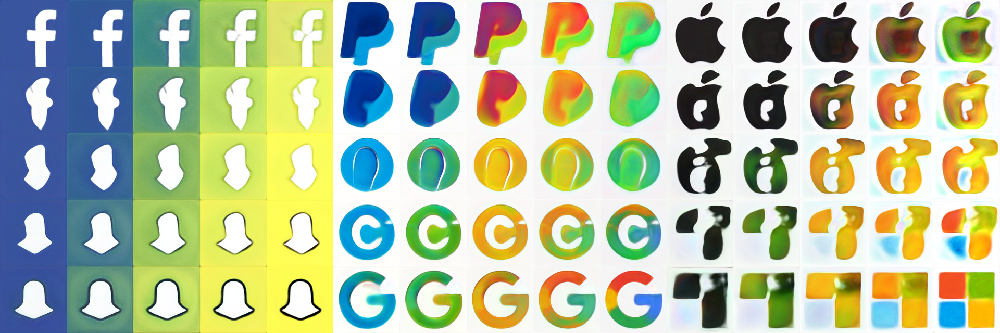

In [ ]:
yah = image_grid([facebook_snapchat, paypal_google, apple_microsoft], 1, 3)
yah.save('/content/drive/MyDrive/Junior Year/IW/Code/figures/many_interpolations.png')
yah

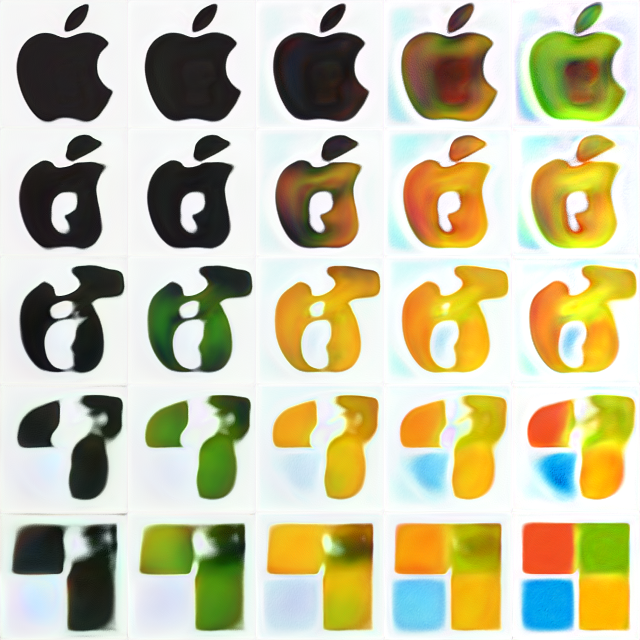

In [ ]:
interpolation = image_grid(interpolation_images, shape + 1, color + 1)
# interpolation.save('/content/drive/MyDrive/Junior Year/IW/Code/figures/paypal_google.png')
interpolation

In [ ]:
print(color_directions.keys())

dict_keys(['red1', 'blue1', 'green1', 'red2', 'blue2', 'green2', 'brightness', 'fill', 'size1', 'size2', 'size3', 'complexity', 'symmetry', 'structural change', 'rigidity'])


In [ ]:
supervised_dict['size_hough_circles'][1] = [4, 6, 1]

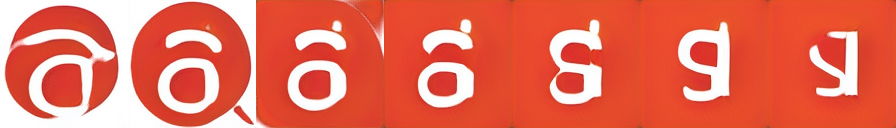

In [ ]:
# direction = supervised_dict['complexity_spatial_information'][0]
# parameters = supervised_dict['complexity_spatial_information'][1]
# parameters = [0, 5, 1]

direction = color_directions['structural change'][3]
parameters = color_directions['structural change'][0:3]
# parameters[1] = 9

im1 = make_latent_interp_img('', 57873533, save=False, one_direction=False, num_interps=7, scale=4, direction=direction, parameters=parameters)
# im1.save('/content/drive/MyDrive/Junior Year/IW/Code/figures/rigidity_traversal.png')
im1

In [ ]:
image_grid([im1, im2], 2,1).save('/content/drive/MyDrive/Junior Year/IW/Code/figures/complexity_compare.png')

In [ ]:
figure_images = [im1, im2, im3, im4, im5]

In [ ]:
size_seeds = [812988239, 812988236, 8129833, 32351, 32353]
size_scale = [25, 30, 45, 30, 30]
size_scale_opposite = [20, 30, 30, 25, 30]
symmetry_seeds = [843, 391049438, 227593684, 227593686, 227593625]
symmetry_scale = [10, 10, 10, 10, 10]
complexity_seeds = [32364, 32365, 32371, 32367, 32369]
complexity_scale = [15, 15, 15, 15, 15]

In [ ]:
red_seeds = [15, 19, 21, 23, 27]
red_scale = [10, 15, 10, 10, 15]
green_seeds = [3348, 130814676, 3349, 73, 75]
green_scale = [10, 10, 10, 10, 15]
blue_seeds = [98, 86, 95, 105, 93]
blue_scale = [10, 10, 5, 10, 20]
black_seeds = [114, 102, 138, 110, 112]
black_scale = [15, 15, 15, 15, 10]

In [ ]:
fill_seeds = [1224077971, 3234223342, 3948, 1259247846, 54423]
fill_scale = [4, 3, 3, 4, 3]
fill_scale_opposite = [4, 2, 4, 2, 3]

rigidity_seeds = [1224077971, 3234223342, 3948, 1259247846, 54423]
rigidity_scale = [2, 3, 5, 5, 4]
rigidity_scale_opposite = [6, 6, 5, 6, 6]

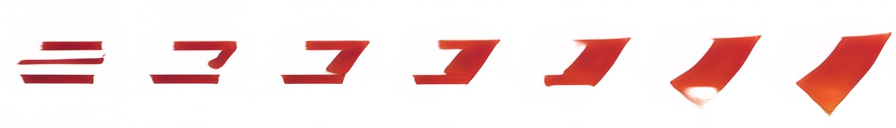

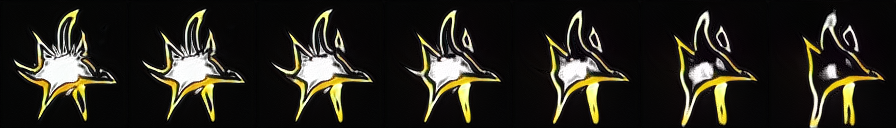

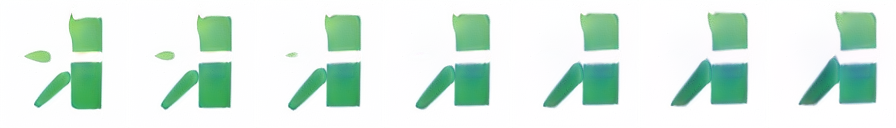

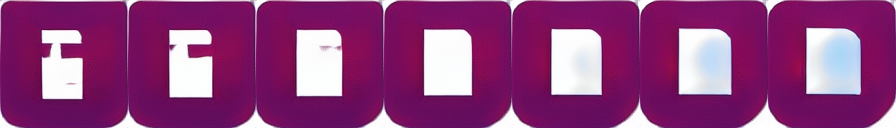

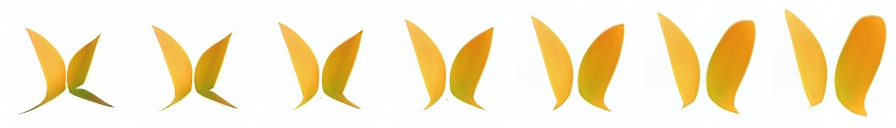

In [ ]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

rows = 5
cols = 1

figure_images = []
for i in range(rows * cols):
  seed = complexity_seeds[i]
  scale = complexity_scale[i] * 1.5
  direction = supervised_dict['complexity_spatial_information'][0]
  parameters = supervised_dict['complexity_spatial_information'][1]
  parameters = [2, 5, 1]

  # direction = -color_directions['structural change'][3]
  # parameters = color_directions['structural change'][0:3]
  
  im = make_latent_interp_img('', seed, save=False, one_direction=True, num_interps=7, scale=scale, direction=direction, parameters=parameters)
  display(im)
  figure_images.append(im)

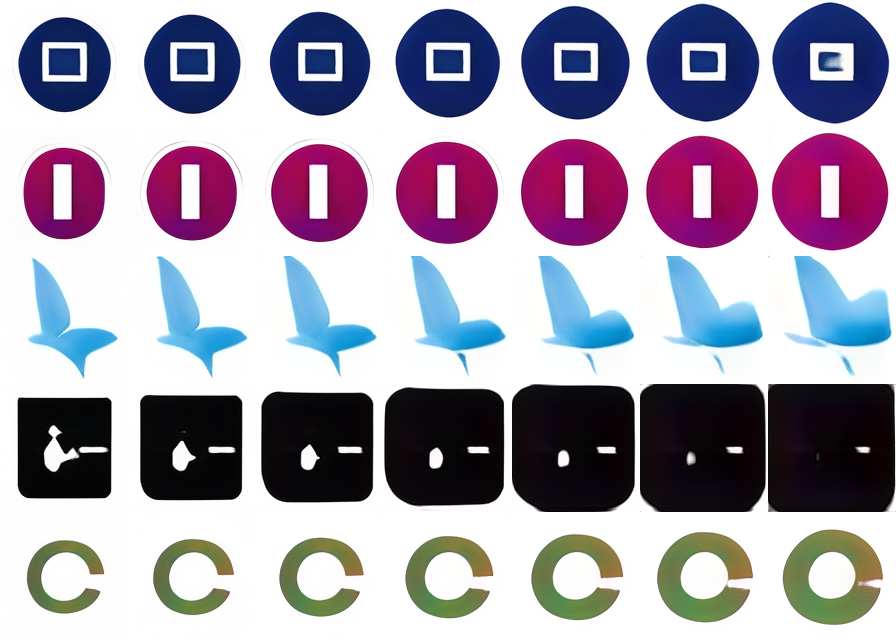

In [ ]:
file = "spatial_information.png"
label_type = "complexity"
grid = image_grid(figure_images, rows, cols)
grid.save(f"/content/drive/MyDrive/Junior Year/IW/Code/supervised_feature_figures/{label_type}/{file}")
grid

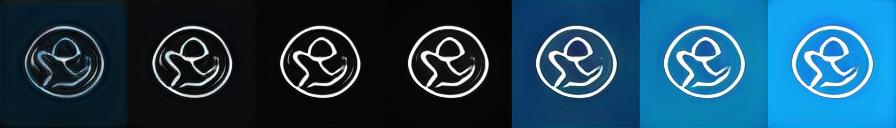

In [ ]:
direction = latent_dirs[named_directions['square_circular'][0]][0]
# direction = supervised_dict['blue_rgb_percentage_contribution'][0]
make_latent_interp_img('5.png', 1, save=False, one_direction=False, num_interps=7, scale=20, direction=direction, parameters=supervised_dict['red_rgb_percentage_contribution'][1])

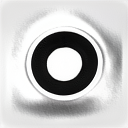

In [ ]:
return_sample(seed=44, truncation=0.7, direction=latent_dirs[named_directions['fill'][0]], distance= 10, scale=1, start=6, end=12)

## Feature Direction Evaluation

## PCA Visualization

In [ ]:
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, s, legend, labels=None, alpha=1, illustrative_var=None, truncate=None):
    '''Display a scatter plot on a factorial plane, one for each factorial plane'''
    i = 0
    # For each factorial plane
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # Initialise the matplotlib figure      
            fig = plt.figure(figsize=(7,6))
        
            # Display the points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                  if value in truncate:
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value, s=s)
                if legend:
                  plt.legend()

            # Display the labels on the points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # Define the limits of the chart
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # Display grid lines
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # Label the axes, with the percentage of variance explained
            plt.xlabel('PC{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('PC{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection of Points for First 2 Principle Components")
            #plt.show(block=False)    

In [ ]:
with open('/content/drive/MyDrive/ganspace/transformer.pkl', 'rb') as f:
  ipca = pickle.load(f)

In [ ]:
transformed = ipca.transform(all_z)

In [ ]:
with open('/content/drive/MyDrive/ganspace/transformer_z.pkl', 'rb') as f:
  ipca = pickle.load(f)

In [ ]:
transformed = ipca.transform(all_z)

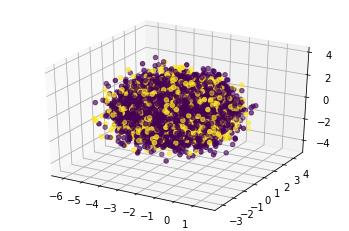

In [ ]:
i = 0
x = transformed[:,i+0]
y = transformed[:,i+1]
z = transformed[:,i+2]

ax = plt.axes(projection ="3d")
ax.scatter3D(x, y, z, c = green_tags)

## Make feature dict

In [ ]:
import pickle
import numpy as np

with open("/content/drive/MyDrive/ganspace/latent_dirs_ipca.npy", "rb") as f:
  latent_dirs = np.load(f)

In [ ]:
import pickle

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/supervised_dict.pkl", "rb") as f:
  supervised_dict = pickle.load(f)

In [ ]:
named_directions = {
    'fill': [0, 6, 12, -1],
    'background_color': [0, 0, 6, 1],
    'red_green': [1, 8, 12, 1],
    'orange_blue': [4, 8, 12, 1],
    'black_red': [6, 8, 12, 1],
    'black_blue': [2, 8, 12, -1],
    'square_circular': [2, 0, 5, 1],
    }

In [ ]:
color_directions = {
    'red': [8, 12, 5, -supervised_dict['red_rgb_percentage_contribution'][0]],
    'blue': [8, 12, 5, -supervised_dict['blue_rgb_percentage_contribution'][0]],
    'green': [8, 12, 5, -supervised_dict['green_rgb_percentage_contribution'][0]],
    'brightness': [8, 12, 5, supervised_dict['black_hsv_maximum_quantity'][0]],
    'fill': [6, 8, 2, -latent_dirs[named_directions['fill'][0]][0]],
    'size': [0, 6, 0.5, latent_dirs[named_directions['fill'][0]][0]],
    'rigidity': [0, 5, 0.5, latent_dirs[named_directions['square_circular'][0]][0]]
    }

In [ ]:
supervised_dict['size_filled_corner_pixels'][1]

[0, 5, 1]

In [ ]:
color_directions = {
    'red1': [8, 12, 4, -supervised_dict['red_hsv_maximum_quantity'][0]],
    'blue1': [8, 12, 4, -supervised_dict['blue_rgb_percentage_contribution'][0]],
    'green1': [8, 12, 4, -supervised_dict['green_hsv_maximum_quantity'][0]],
    'red2': [8, 12, 5, -supervised_dict['red_rgb_percentage_contribution'][0]],
    'blue2': [8, 12, 5, -supervised_dict['blue_hsv_maximum_quantity'][0]],
    'green2': [8, 12, 5, -supervised_dict['green_rgb_percentage_contribution'][0]],
    'brightness': [8, 12, 3, supervised_dict['black_hsv_maximum_quantity'][0]],
    'fill': [6, 8, 3, latent_dirs[named_directions['fill'][0]][0]],
    'size1': [4, 6, 10, -supervised_dict['size_binary_thresholding'][0]],
    'size3': [4, 6, 10, supervised_dict['size_filled_corner_pixels'][0]],
    'size2': [4, 6, 10, supervised_dict['size_hough_circles'][0]],
    'complexity': [0, 4, 5, -supervised_dict['complexity_spatial_information'][0]],
    'complexity1': [0, 4, 5, -supervised_dict['complexity_spatial_information'][0]],
    'complexity2': [0, 4, 5, -supervised_dict['complexity_blob_thresholding'][0]],
    'symmetry': [0, 6, 5, supervised_dict['symmetry_binary_split_comparison'][0]],
    'structural change': [0, 6, 0.5, latent_dirs[named_directions['fill'][0]][0]],
    'rigidity': [0, 5, 0.5, -latent_dirs[named_directions['square_circular'][0]][0]]
    }

In [ ]:
import pickle as pkl
output = open('/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/final_feature_dict.pkl', 'wb')
pickle.dump(color_directions, output)
output.close()

## Seeds dict

In [ ]:
import pickle

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/seeds/red_rgb_seeds.pkl", "rb") as f:
  red_rgb = pickle.load(f)

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/seeds/blue_rgb_seeds.pkl", "rb") as f:
  blue_rgb = pickle.load(f)

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/seeds/green_rgb_seeds.pkl", "rb") as f:
  green_rgb = pickle.load(f)

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/seeds/red_hsv_seeds.pkl", "rb") as f:
  red_hsv = pickle.load(f)

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/seeds/blue_hsv_seeds.pkl", "rb") as f:
  blue_hsv = pickle.load(f)

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/seeds/green_hsv_seeds.pkl", "rb") as f:
  green_hsv = pickle.load(f)

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/seeds/black_seeds.pkl", "rb") as f:
  black_hsv = pickle.load(f)

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/seeds/symmetry_seeds.pkl", "rb") as f:
  symmetry = pickle.load(f)

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/seeds/complexity_seeds.pkl", "rb") as f:
  complexity = pickle.load(f)

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/seeds/background_color_seeds.pkl", "rb") as f:
  filled_background = pickle.load(f)

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/seeds/all_seeds.pkl", "rb") as f:
  all = pickle.load(f)

In [ ]:
seeds_dict = {
    'all': all,
    'red_rgb': red_rgb,
    'green_rgb': green_rgb,
    'blue_rgb': blue_rgb,
    'red_hsv': red_hsv,
    'green_hsv': green_hsv,
    'blue_hsv': blue_hsv,
    'black': black_hsv,
    'symmetrical': symmetry,
    'complex': complexity,
    'filled background': filled_background
}

In [ ]:
seeds_dict = {
    'all': all,
    'red': red_rgb,
    'green': green_rgb,
    'blue': blue_rgb,
    'black': black_hsv,
    'symmetrical': symmetry,
    'filled background': filled_background
}

In [ ]:
len(seeds_dict)

7

In [ ]:
import pickle as pkl
output = open('/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/seeds/seeds_dict.pkl', 'wb')
pickle.dump(seeds_dict, output)
output.close()

## Projection Dict

In [ ]:
import pickle

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/projected_comb.pkl", "rb") as f:
  comb = pickle.load(f)

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/projected_regular.pkl", "rb") as f:
  regular = pickle.load(f)

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/projected_abs.pkl", "rb") as f:
  abs = pickle.load(f)

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/projected_l2.pkl", "rb") as f:
  l2 = pickle.load(f)

In [ ]:
from PIL import Image
import glob
proj_images = []
filenames = []
for filename in glob.glob('/content/drive/MyDrive/stylegan2-colab/stylegan2/projection_images/*png'):
    filenames.append(filename)

for filename in sorted(filenames): #assuming gif
    im=Image.open(filename)
    im = im.resize((128, 128))
    proj_images.append(im)

In [ ]:
projections = l2
proj_images = []

for key in sorted(projections.keys()):
  w = projections[key]
  im = generate_images_from_dlatents(w, truncation_psi=1)
  proj_images.append(Image.fromarray(im))

In [ ]:
proj_images.append(Image.fromarray(np.ones((128, 128, 3), dtype=np.uint8)*255))

In [ ]:
grid = image_grid(proj_images, 4, 6)

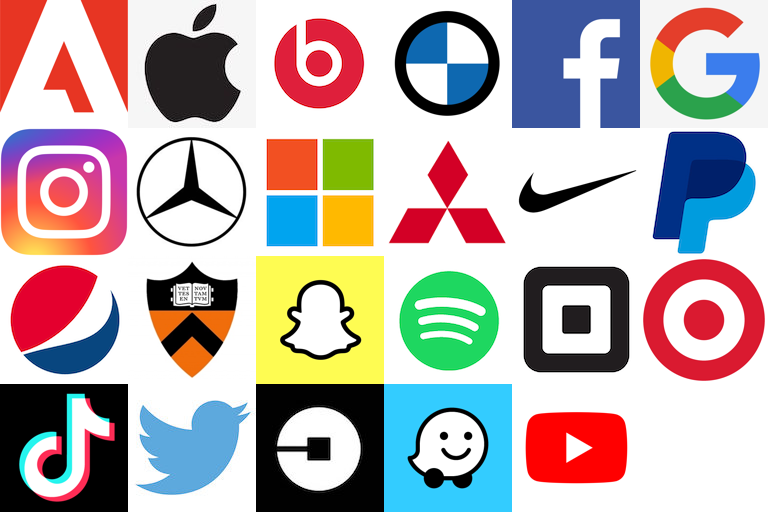

In [ ]:
grid

In [ ]:
grid.save('/content/drive/MyDrive/Junior Year/IW/Code/figures/projections/original.png')

In [ ]:
comb.keys()

dict_keys(['apple', 'adobe', 'microsoft', 'beats', 'bmw', 'facebook', 'google', 'instagram', 'mercedes', 'mitsubishi', 'nike', 'paypal', 'pepsi', 'princeton', 'snapchat', 'spotify', 'square', 'target', 'tiktok', 'twitter', 'uber', 'waze', 'youtube'])

In [ ]:
final = {
    'apple2': regular['apple'],
    'beats': regular['beats'],
    'mercedes': regular['mercedes'],
    'paypal': regular['paypal'],
    'pepsi': regular['pepsi'],
    'spotify': regular['spotify'],
    'square': regular['square'],
    'target': regular['target'],
    'twitter': regular['twitter'],
    'youtube': regular['youtube']
}

In [ ]:
for key in comb:
  if key in final:
    continue
  else:
    final[key] = comb[key]

In [ ]:
final.keys()

dict_keys(['apple2', 'beats', 'mercedes', 'paypal', 'pepsi', 'spotify', 'square', 'target', 'twitter', 'youtube', 'apple', 'adobe', 'microsoft', 'bmw', 'facebook', 'google', 'instagram', 'mitsubishi', 'nike', 'princeton', 'snapchat', 'tiktok', 'uber', 'waze'])

In [ ]:
import pickle as pkl
output = open('/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/projected_final.pkl', 'wb')
pickle.dump(final, output)
output.close()

## FID

In [ ]:
import pickle
import numpy as np

with open("/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/images.npy", "rb") as f:
  images = np.load(f)

In [ ]:
images = images[:5000]

In [ ]:
with open('/content/drive/MyDrive/Junior Year/IW/Code/datasets/medium.npy', 'rb') as f:
    dataset_images = np.load(f)

In [ ]:
dataset_images = dataset_images[:10000]

In [ ]:
# example of calculating the frechet inception distance in Keras
import numpy
import numpy as np
from numpy import cov
from numpy import trace
from numpy import iscomplexobj
from numpy import asarray
from numpy.random import randint
from scipy.linalg import sqrtm
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from keras.datasets.mnist import load_data
from skimage.transform import resize
 
# scale an array of images to a new size
def scale_images(images, new_shape):
	images_list = list()
	for image in images:
		# resize with nearest neighbor interpolation
		new_image = resize(image, new_shape, 0)
		# store
		images_list.append(new_image)
	return asarray(images_list)
 
# calculate frechet inception distance
def calculate_fid(model, images1, images2):
	# calculate activations
	act1 = model.predict(images1)
	act2 = model.predict(images2)
	# calculate mean and covariance statistics
	mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
	mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
	# calculate sum squared difference between means
	ssdiff = numpy.sum((mu1 - mu2)**2.0)
	# calculate sqrt of product between cov
	covmean = sqrtm(sigma1.dot(sigma2))
	# check and correct imaginary numbers from sqrt
	if iscomplexobj(covmean):
		covmean = covmean.real
	# calculate score
	fid = ssdiff + trace(sigma1 + sigma2 - 2.0 * covmean)
	return fid

In [ ]:
# prepare the inception v3 model
model = InceptionV3(include_top=False, pooling='avg', input_shape=(128,128,3))

In [ ]:
# convert integer to floating point values
images1 = dataset_images
images2 = images

images1 = images1.astype('float16')
images2 = images2.astype('float16')

In [ ]:
# pre-process images
images1 = preprocess_input(images1)
images2 = preprocess_input(images2)

In [ ]:
# fid between images1 and images1
fid = calculate_fid(model, images1, images1)
print('FID (same): %.3f' % fid)

FID (same): -0.000


In [ ]:
# fid between images1 and images2
fid = calculate_fid(model, images1, images2)
print('FID (different): %.3f' % fid)

FID (different): 340.749


## Testing

In [ ]:
import pickle as pkl
with open('/content/drive/MyDrive/Junior Year/IW/Code/latent_exploration/final_feature_dict.pkl', 'rb') as f:
  directions = pickle.load(f)

In [ ]:
num_images = 500
np.random.seed(10)
compare_seeds = np.random.randint(10000000, size=(num_images))

compare_z = np.stack([np.random.RandomState(seed).randn(*Gs.input_shape[1:]) for seed in compare_seeds]) # [minibatch, component]

In [ ]:
# Generate images
fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
compare_images = []
compare_im_arrays = np.zeros((num_images, 128, 128, 3))

for i in range(num_images):
  im = Gs.run(np.stack([compare_z[i]]), None, **Gs_kwargs).squeeze()
  compare_images.append(Image.fromarray(np.uint8(im)))
  compare_im_arrays[i] = im

In [ ]:
# Score color outputs
direction = directions['brightness'][3]
start, end, scale = directions['brightness'][:3]
distance = 20

channel_absolute_errors = np.zeros((num_images, 3))
channel_squared_errors = np.zeros((num_images, 3))
channel_euclidian_distance = np.zeros((num_images, 3))

for i in range(50):
  seed = compare_seeds[i]
  compare_im = return_sample(seed=seed, truncation=0.7, direction=direction, distance=distance, scale=scale, start=start, end=end)
  original_im = compare_images[i]

  original_im_array = compare_im_arrays[i]
  compare_im_array = np.asarray(compare_im)

  original_im_array = original_im_array / 255
  compare_im_array = compare_im_array / 255

  channel_absolute_errors[i][0] = np.mean(np.abs(original_im_array[:,:,0] - compare_im_array[:,:,0]))
  channel_absolute_errors[i][1] = np.mean(np.abs(original_im_array[:,:,1] - compare_im_array[:,:,1]))
  channel_absolute_errors[i][2] = np.mean(np.abs(original_im_array[:,:,2] - compare_im_array[:,:,2]))

  channel_squared_errors[i][0] = np.mean(np.square(original_im_array[:,:,0] - compare_im_array[:,:,0]))
  channel_squared_errors[i][1] = np.mean(np.square(original_im_array[:,:,1] - compare_im_array[:,:,1]))
  channel_squared_errors[i][2] = np.mean(np.square(original_im_array[:,:,2] - compare_im_array[:,:,2]))

  channel_euclidian_distance[i][0] = euclidean(original_im_array[:,:,0].flatten(), compare_im_array[:,:,0].flatten())
  channel_euclidian_distance[i][1] = euclidean(original_im_array[:,:,1].flatten(), compare_im_array[:,:,1].flatten())
  channel_euclidian_distance[i][2] = euclidean(original_im_array[:,:,2].flatten(), compare_im_array[:,:,2].flatten())

  # display(image_grid([original_im, compare_im], 1, 2))

In [ ]:
red_error = np.round(np.mean(channel_absolute_errors[:,0]), 3)
green_error = np.round(np.mean(channel_absolute_errors[:,1]), 3)
blue_error = np.round(np.mean(channel_absolute_errors[:,2]), 3)

print(f'MAE')
print(f'Red: {red_error}  Green: {green_error}  Blue: {blue_error}')

red_error = np.round(np.mean(channel_squared_errors[:,0]), 3)
green_error = np.round(np.mean(channel_squared_errors[:,1]), 3)
blue_error = np.round(np.mean(channel_squared_errors[:,2]), 3)

print()
print('MSE')
print(f'Red: {red_error}  Green: {green_error}  Blue: {blue_error}')

red_error = np.round(np.mean(channel_euclidian_distance[:,0]), 3)
green_error = np.round(np.mean(channel_euclidian_distance[:,1]), 3)
blue_error = np.round(np.mean(channel_euclidian_distance[:,2]), 3)
print()
print('Distance')
print(f'Red: {red_error}  Green: {green_error}  Blue: {blue_error}')

MAE
Red: 0.017  Green: 0.014  Blue: 0.013

MSE
Red: 0.01  Green: 0.006  Blue: 0.006

Distance
Red: 3.092  Green: 2.313  Blue: 2.258


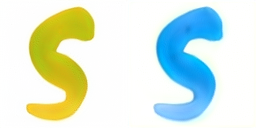

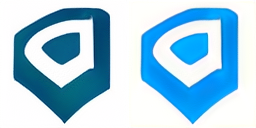

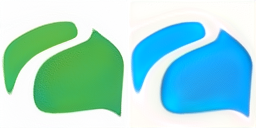

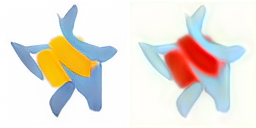

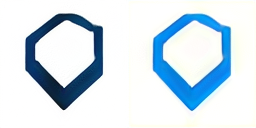

...

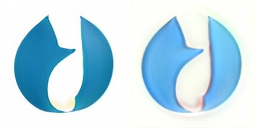

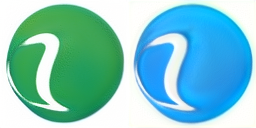

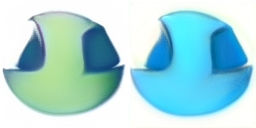

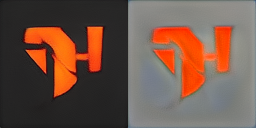

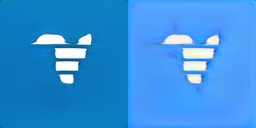

In [ ]:
# Score color outputs
direction = directions['blue2'][3]
start, end, scale = directions['blue2'][:3]
distance = 20

for i in range(50):
  seed = compare_seeds[i]
  compare_im = return_sample(seed=seed, truncation=0.7, direction=direction, distance=distance, scale=scale, start=start, end=end)
  original_im = compare_images[i]
  display(image_grid([original_im, compare_im], 1, 2))